## Prepare for the envrioment
Load the libraries and packages

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import seaborn as sns

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [3]:
sample_strings = ['Duo_M1', 'Duo_M2', 'Jej_M1', 'Jej_M2', 'Il_M1', 'Il_M2']
sample_id_strings = ['3', '4', '5', '6', '7', '8']
file_base = '/home/yiyang/github/MD/data/GSE92332_uncompressed/GSM283657'
exp_string = '_Regional_'
data_file_end = '_matrix.mtx'
barcode_file_end = '_barcodes.tsv'
gene_file_end = '_genes.tsv'
cc_genes_file = '/home/yiyang/github/MD/data/Macosko_cell_cycle_genes.txt'


In [4]:

# Initialize a dataset adatas to store the dataset
adatas = []

for sample, sample_id in zip(sample_strings, sample_id_strings):
    # 解析文件名
    data_file = f"{file_base}{sample_id}{exp_string}{sample}{data_file_end}"
    barcode_file = f"{file_base}{sample_id}{exp_string}{sample}{barcode_file_end}"
    gene_file = f"{file_base}{sample_id}{exp_string}{sample}{gene_file_end}"
    
    # Load data
    adata = sc.read(data_file, cache=True).transpose()
    adata.X = adata.X.toarray()

    barcodes = pd.read_csv(barcode_file, header=None, sep='\t')
    genes = pd.read_csv(gene_file, header=None, sep='\t')

    # Annotate data
    barcodes.rename(columns={0:'barcode'}, inplace=True)
    barcodes.set_index('barcode', inplace=True)
    adata.obs = barcodes
    adata.obs['sample'] = sample
    adata.obs['region'] = sample.split("_")[0]
    adata.obs['donor'] = sample.split("_")[1]

    genes.rename(columns={0:'gene_id', 1:'gene_symbol'}, inplace=True)
    genes['gene_symbol'] = genes['gene_symbol'].str.replace('^mm10_', '', regex=True)
    genes.set_index('gene_symbol', inplace=True)
    adata.var = genes

    adata.var_names_make_unique()

    adatas.append(adata)

# combine all the data
adata = adatas[0].concatenate(adatas[1:], batch_key='sample_id')

if 'gene_id-1' in adata.var.columns:
    adata.var['gene_id'] = adata.var['gene_id-1']
    adata.var.drop(columns=['gene_id-1', 'gene_id-0'], inplace=True)

adata.obs.drop(columns=['sample_id'], inplace=True)
adata.obs_names = [c.split("-")[0] for c in adata.obs_names]
adata.obs_names_make_unique(join='_')

print(f"Load data finished. There are {adata.n_obs} cells and  {adata.n_vars} genes.")
adata.write('/home/yiyang/github/MD/data/mouse_intestinal_epithelium.h5ad')


/tmp/ipykernel_909469/1250256111.py:35: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = adatas[0].concatenate(adatas[1:], batch_key='sample_id')


Load data finished. There are 13353 cells and  27998 genes.


In [5]:
print("region:")
print(adata.obs['region'].value_counts())
print("\n" + "="*50 + "\n")

print("donor:")
print(adata.obs['donor'].value_counts())
print("\n" + "="*50 + "\n")

print("sample:")
print(adata.obs['sample'].value_counts())
print("\n" + "="*50 + "\n")


region:
region
Duo    4554
Jej    4496
Il     4303
Name: count, dtype: int64


donor:
donor
M2    6711
M1    6642
Name: count, dtype: int64


sample:
sample
Jej_M2    2668
Il_M1     2466
Duo_M1    2348
Duo_M2    2206
Il_M2     1837
Jej_M1    1828
Name: count, dtype: int64




## Quality control
Accroding to the information, I found we usually use mitochondrial genes as a very important reference, and when there are too many mitochondrial genes it is usually assumed that the cell is under stress or dying.

### MT fraction part

In [6]:
# Calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

mt_gene_mask = [gene.startswith('mt-') for gene in adata.var_names]
adata.obs['mt_frac'] = adata.X[:, mt_gene_mask].sum(1)/adata.obs['n_counts']

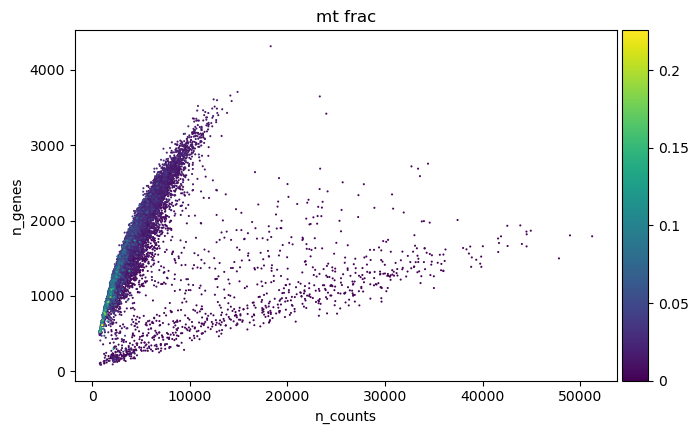

In [7]:
#Data summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='mt_frac')


From this plot, we can see that cells with lower counts and genes tend to have a higher fraction of mitochondrial counts. We can think these cells are likely under stress or are dying. To have a deeper look, we should focus on this part.

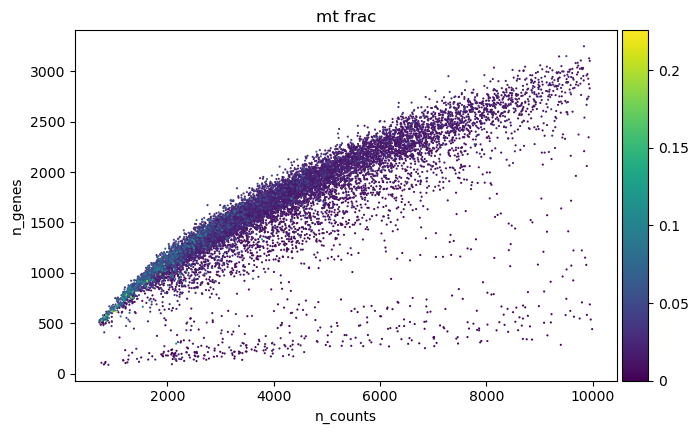

In [8]:
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='mt_frac')

This plot can help us focus on the high MT fraction part. This can also prove our perspective, cells with lower counts and genes tend to have a higher fraction of mitochondrial counts. So next step is to filter these parts.

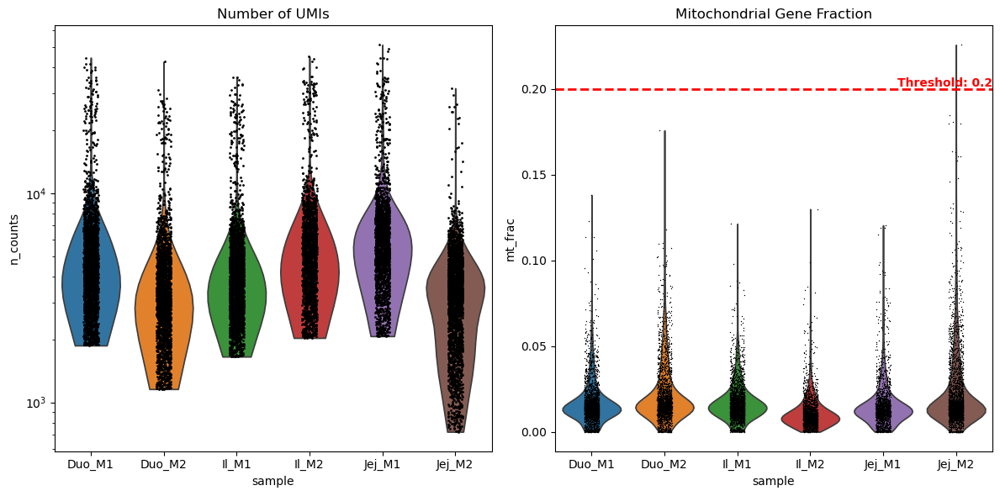

In [9]:
mt_threshold = 0.20

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

sc.pl.violin(adata, 'n_counts', groupby='sample', size=2, log=True, cut=0, ax=ax1, show=False)
ax1.set_title('Number of UMIs')

sc.pl.violin(adata, 'mt_frac', groupby='sample', ax=ax2, show=False)
ax2.set_title('Mitochondrial Gene Fraction')

ax2.axhline(y=mt_threshold, color='red', linestyle='--', linewidth=2)

ax2.text(ax2.get_xlim()[1], mt_threshold, f'Threshold: {mt_threshold}', 
         ha='right', va='bottom', color='red', fontweight='bold')

plt.tight_layout()

plt.show()

We can see the right panel, there are only a few samples are under stress or dying. But there is also another important reference is the counts. Our original goal was definitely to include as many cells as possible, but sometimes too many or too few can lead to problems in our downstream analysis, so choosing the right number is also an important aspect. From the left panel we can see that many samples have UMI counts well above or below the main distribution, which may indicate that these cells are abnormal or of poor quality. Now we will foces on the **count** and **genes**.

### The UMI counts part
Histograms are a great tool for us to observe the effects of cell counting.

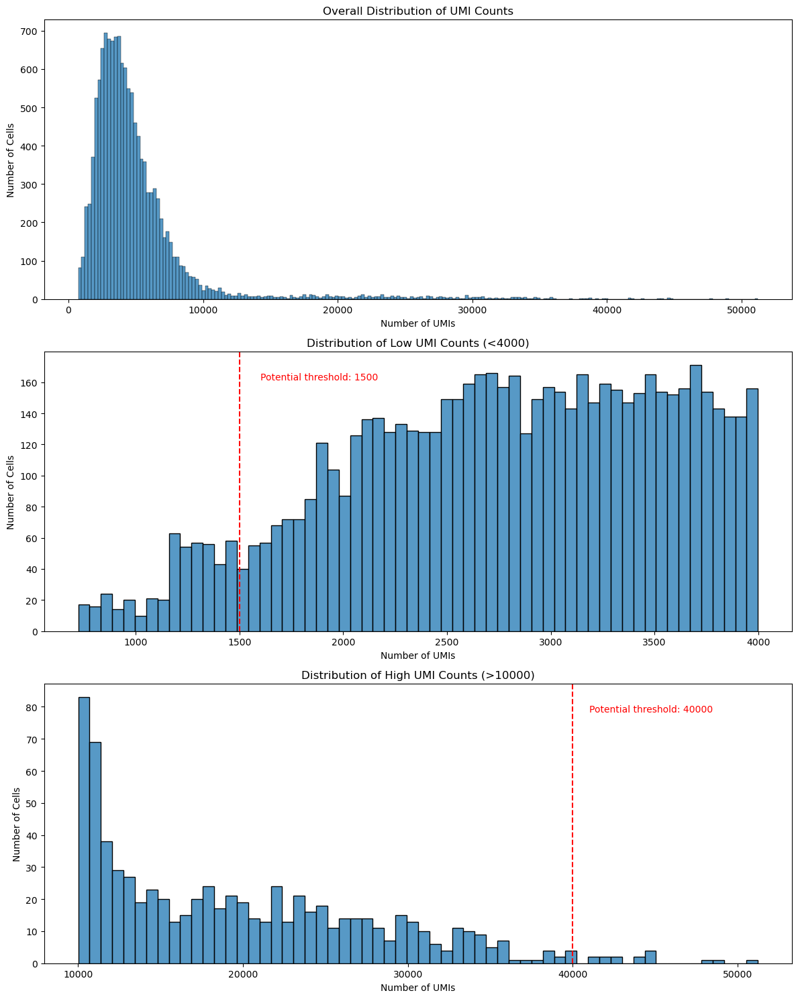

In [10]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 15))

# Overall distribution
sns.histplot(adata.obs['n_counts'], kde=False, ax=ax1)
ax1.set_title('Overall Distribution of UMI Counts')
ax1.set_xlabel('Number of UMIs')
ax1.set_ylabel('Number of Cells')

# Low count distribution
sns.histplot(adata.obs['n_counts'][adata.obs['n_counts'] < 4000], kde=False, bins=60, ax=ax2)
ax2.set_title('Distribution of Low UMI Counts (<4000)')
ax2.set_xlabel('Number of UMIs')
ax2.set_ylabel('Number of Cells')
ax2.axvline(x=1500, color='r', linestyle='--')
ax2.text(1600, ax2.get_ylim()[1]*0.9, 'Potential threshold: 1500', color='r', rotation=0)

# High count distribution
sns.histplot(adata.obs['n_counts'][adata.obs['n_counts'] > 10000], kde=False, bins=60, ax=ax3)
ax3.set_title('Distribution of High UMI Counts (>10000)')
ax3.set_xlabel('Number of UMIs')
ax3.set_ylabel('Number of Cells')
ax3.axvline(x=40000, color='r', linestyle='--')
ax3.text(41000, ax3.get_ylim()[1]*0.9, 'Potential threshold: 40000', color='r', rotation=0)

plt.tight_layout()
plt.show()

There are two small peaks of groups of cells with fewer than 1500 counts. which are likely uninformative given the overall distribution of counts. This may be cellular debris found in droplets. The other peak at 20,000 counts. We estimate this population to range until 40,000 counts. This estimation is performed by visually tracing a Gaussian around the population.

### The gene parts


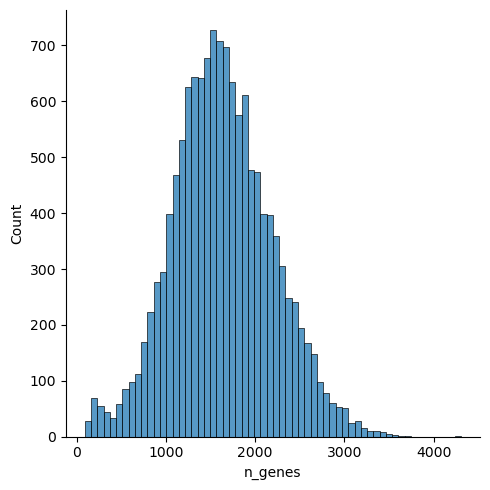

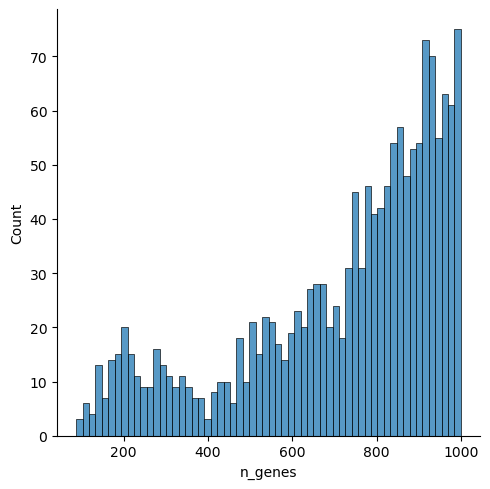

In [11]:
p6 = sb.displot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sb.displot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60)
plt.show()

Two populations of cells with low gene counts can be seen in the above plots. We decide to filter out cells with fewer than 700 genes expressed. Below this we are likely to find dying cells or empty droplets with ambient RNA. 

Finally, my filter part is this:

In [12]:
# Filter cells
print('Total number of cells: {:d}'.format(adata.n_obs))

# Counts
sc.pp.filter_cells(adata, min_counts = 1500)
sc.pp.filter_cells(adata, max_counts = 40000)

# MT frac
adata = adata[adata.obs['mt_frac'] < 0.2]

# Gene
sc.pp.filter_cells(adata, min_genes = 700)

print('Number of cells after filter: {:d}'.format(adata.n_obs))

Total number of cells: 13353


/home/yiyang/anaconda3/envs/scRNA-seq/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:166: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_genes"] = number


Number of cells after filter: 12457


We also need to filter the genes that ther are not detected in at least 20 cells. Because these genes are too few so we can think they will not have much influence on our analysis.

In [13]:
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Number of genes after cell filter: 12818


In [14]:
adata.write('/home/yiyang/github/MD/data/mouse_afterQC.h5ad')


## Normalization

In [2]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler
import seaborn as sns

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

In [2]:
# # Load R magic in a Jupyter notebook
# %load_ext rpy2.ipython


In [3]:
adata = sc.read('/home/yiyang/github/MD/data/mouse_afterQC.h5ad')
adata.shape


(12457, 12818)

In [9]:
# #Perform a clustering for scran normalization in clusters
# adata_pp = adata.copy()
# sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
# sc.pp.log1p(adata_pp)
# sc.pp.pca(adata_pp, n_comps=15)
# sc.pp.neighbors(adata_pp)
# sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)
# input_groups = adata_pp.obs['groups']
# data_mat = adata.X.T
# data_mat.shape
# %%R
# batch_compute_sum_factors <- function(data_mat, input_groups, batch_size = 1000) {
#   n_cells <- ncol(data_mat)
#   n_batches <- ceiling(n_cells / batch_size)
  
#   size_factors_list <- vector("list", n_batches)
  
#   for (i in 1:n_batches) {
#     start_idx <- (i - 1) * batch_size + 1
#     end_idx <- min(i * batch_size, n_cells)
    
#     batch_data <- data_mat[, start_idx:end_idx]
#     batch_groups <- input_groups[start_idx:end_idx]
    
#     size_factors_list[[i]] <- computeSumFactors(batch_data, 
#                                                 clusters = batch_groups, 
#                                                 min.mean = 0.1)
#   }
  
#   size_factors <- unlist(size_factors_list)
  
#   return(size_factors)
# }
# %%R

# size_factors <- batch_compute_sum_factors(data_mat, input_groups, batch_size = 1000)



In [4]:
adata.layers["counts"] = adata.X.copy()

# Normalize to total counts per cell
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

The reason that I use this method is because I compared the result of test_cluster.ipynb. This combination performs best.

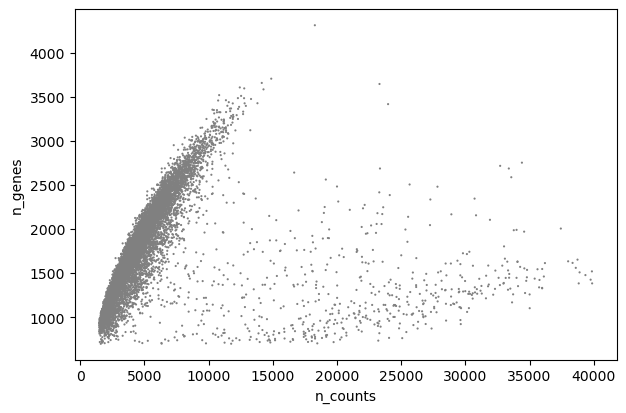

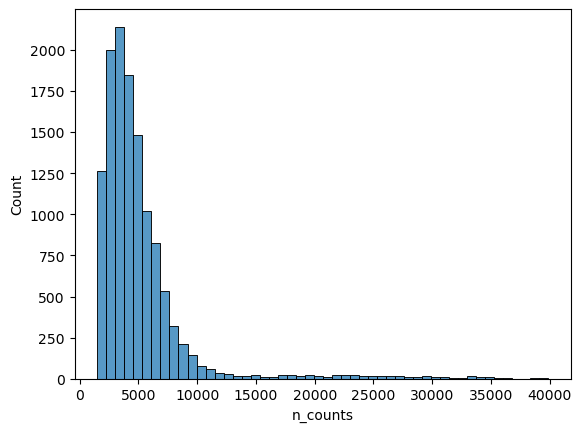

In [5]:
sc.pl.scatter(adata, 'n_counts', 'n_genes')
sb.histplot(adata.obs['n_counts'], bins=50, kde=False)
plt.show()


1. The normalized counts are non-negative and closely related to the number of counts per cell, as expected.
2. The normalized counts are positively related to the number of genes per cell, but the relationship might vary more compared to the raw counts.
3. The distribution of normalized counts is as expected—mostly concentrated on the lower side with a long tail.

## Highly Variable Genes

In [6]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=4000)


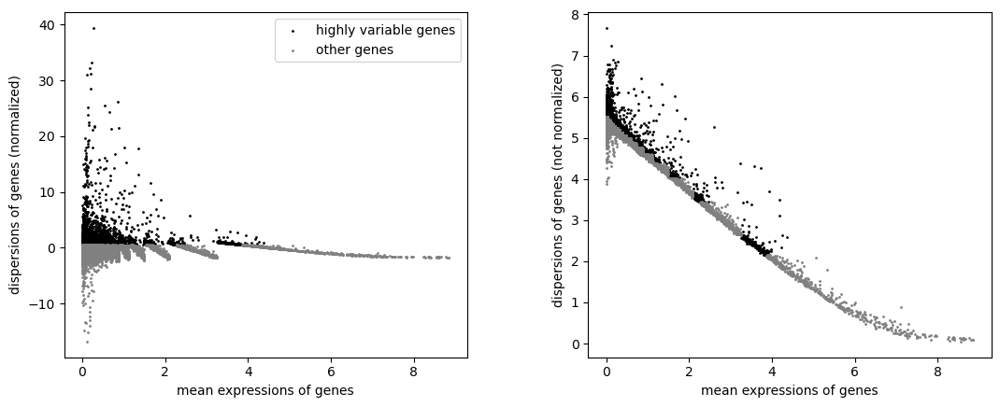

In [7]:
sc.pl.highly_variable_genes(adata)

The left panel has a standardized dispersion that shows the biological variant genes more clearly and eliminates some of the technical noise that would otherwise obscure the results, as shown in the right panel.

In [8]:
# Calculate the visualizations
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)

sc.tl.tsne(adata, n_jobs=12) #Note n_jobs works for MulticoreTSNE, but not regular implementation)
sc.tl.umap(adata)


/home/yiyang/anaconda3/envs/scRNA-seq/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:385: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)
/home/yiyang/anaconda3/envs/scRNA-seq/lib/python3.11/site-packages/scanpy/tools/_tsne.py:126: UserWarning: In previous versions of scanpy, calling tsne with n_jobs > 1 would use MulticoreTSNE. Now this uses the scikit-learn version of TSNE by default. If you'd like the old behaviour (which is deprecated), pass 'use_fast_tsne=True'. Note, MulticoreTSNE is not actually faster anymore.
  warnings.warn(


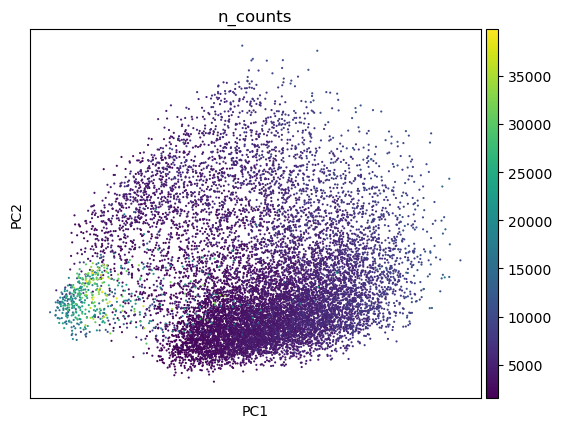

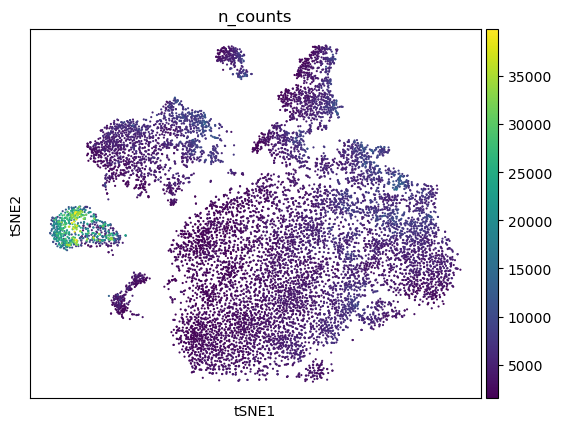

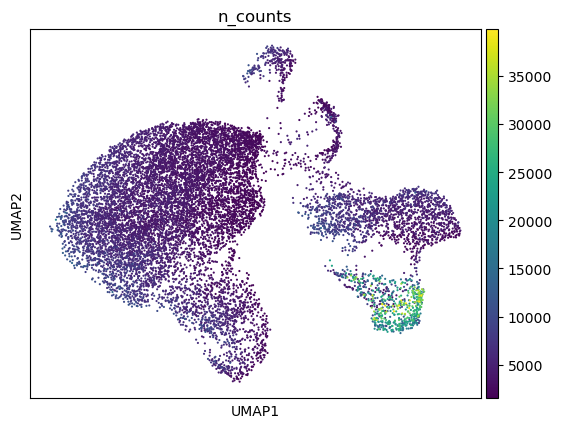

In [9]:
sc.pl.pca_scatter(adata, color='n_counts')
sc.pl.tsne(adata, color='n_counts')
sc.pl.umap(adata, color='n_counts')


From above, we can learn that the pca figure can not show specific separation of different cells. Both tSNE and UMAP show distinct groupings of cells, with some dense regions and a clear separation of clusters. But because UMAP balances both local and global structure preservation. So I will select UMAP method.

## Clustering

In [10]:
# Perform clustering - using highly variable genes
sc.tl.leiden(adata, key_added='leiden_r0.5')
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_r0.5', random_state=10)

/tmp/ipykernel_1834281/31633190.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, key_added='leiden_r0.5')


In [11]:
adata.obs['leiden_r0.5'].value_counts()

leiden_r0.5
0    2205
1    1971
2    1732
3    1685
4    1410
5    1154
6    1114
7     669
8     261
9     256
Name: count, dtype: int64

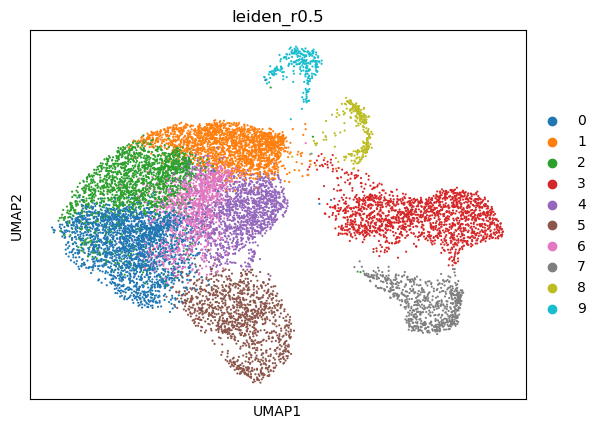

In [12]:
sc.pl.umap(adata, color=['leiden_r0.5'])


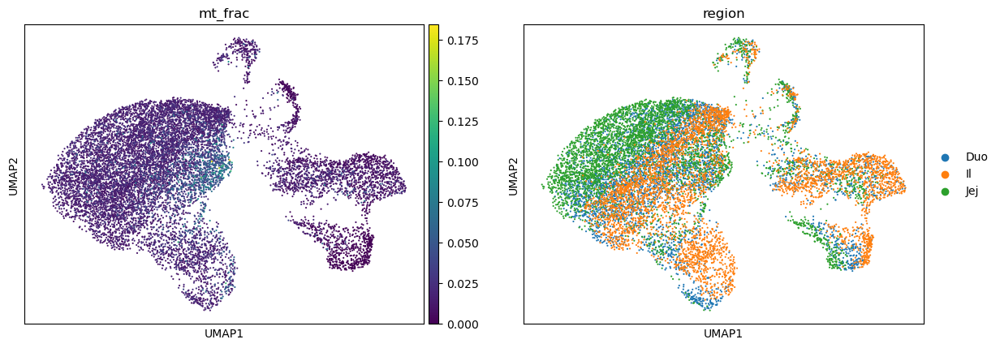

In [13]:
sc.pl.umap(adata, color=['mt_frac', 'region'])

The region UMAP figure shows cells colored by tissue region (Duo, Il, Jej). It appears that the clusters are well aligned with specific regions, indicating that the clusters are biologically relevant and correspond to spatial or tissue-based organizations.

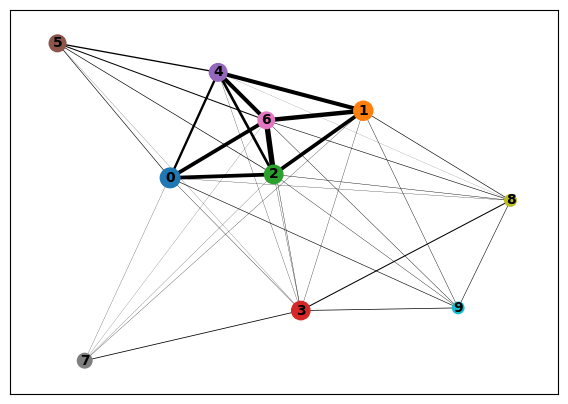

In [14]:
sc.tl.paga(adata, groups='leiden_r0.5')
sc.pl.paga(adata, color='leiden_r0.5')


This figure shows how clusters are related to each other based on their connectivity. The thicker the line, the stronger the relationship between clusters.

In [15]:
#Known marker genes:
marker_genes = dict()
marker_genes['Stem'] = ['Lgr5', 'Ascl2', 'Slc12a2', 'Axin2', 'Olfm4', 'Gkn3']
marker_genes['Enterocyte (Proximal)'] = ['Gsta1','Rbp2','Adh6a','Apoa4','Reg3a','Creb3l3','Cyp3a13','Cyp2d26','Ms4a10','Ace','Aldh1a1','Rdh7','H2-Q2', 'Hsd17b6','Gstm3','Gda','Apoc3','Gpd1','Fabp1','Slc5a1','Mme','Cox7a1','Gsta4','Lct','Khk','Mttp','Xdh','Sult1b1', 'Treh','Lpgat1','Dhrs1','Cyp2c66','Ephx2','Cyp2c65','Cyp3a25','Slc2a2','Ugdh','Gstm6','Retsat','Ppap2a','Acsl5', 'Cyb5r3','Cyb5b','Ckmt1','Aldob','Ckb','Scp2','Prap1']
marker_genes['Enterocyte (Distal)'] = ['Tmigd1','Fabp6','Slc51b','Slc51a','Mep1a','Fam151a','Naaladl1','Slc34a2','Plb1','Nudt4','Dpep1','Pmp22','Xpnpep2','Muc3','Neu1','Clec2h','Phgr1','2200002D01Rik','Prss30','Cubn','Plec','Fgf15','Crip1','Krt20','Dhcr24','Myo15b','Amn','Enpep','Anpep','Slc7a9','Ocm','Anxa2','Aoc1','Ceacam20','Arf6','Abcb1a','Xpnpep1','Vnn1','Cndp2','Nostrin','Slc13a1','Aspa','Maf','Myh14']
marker_genes['Goblet'] = ['Agr2', 'Fcgbp', 'Tff3', 'Clca1', 'Zg16', 'Tpsg1', 'Muc2', 'Galnt12', 'Atoh1', 'Rep15', 'S100a6', 'Pdia5', 'Klk1', 'Pla2g10', 'Spdef', 'Lrrc26', 'Ccl9', 'Bace2', 'Bcas1', 'Slc12a8', 'Smim14', 'Tspan13', 'Txndc5', 'Creb3l4', 'C1galt1c1', 'Creb3l1', 'Qsox1', 'Guca2a', 'Scin', 'Ern2', 'AW112010', 'Fkbp11', 'Capn9', 'Stard3nl', 'Slc50a1', 'Sdf2l1', 'Hgfa', 'Galnt7', 'Hpd', 'Ttc39a', 'Tmed3', 'Pdia6', 'Uap1', 'Gcnt3', 'Tnfaip8', 'Dnajc10', 'Ergic1', 'Tsta3', 'Kdelr3', 'Foxa3', 'Tpd52', 'Tmed9', 'Spink4', 'Nans', 'Cmtm7', 'Creld2', 'Tm9sf3', 'Wars', 'Smim6', 'Manf', 'Oit1', 'Tram1', 'Kdelr2', 'Xbp1', 'Serp1', 'Vimp', 'Guk1', 'Sh3bgrl3', 'Cmpk1', 'Tmsb10', 'Dap', 'Ostc', 'Ssr4', 'Sec61b', 'Pdia3', 'Gale', 'Klf4', 'Krtcap2', 'Arf4', 'Sep15', 'Ssr2', 'Ramp1', 'Calr', 'Ddost']
marker_genes['Paneth'] = ['Gm15284', 'AY761184', 'Defa17', 'Gm14851', 'Defa22', 'Defa-rs1', 'Defa3', 'Defa24', 'Defa26', 'Defa21', 'Lyz1', 'Gm15292', 'Mptx2', 'Ang4']
marker_genes['Enteroendocrine'] = ['Chgb', 'Gfra3', 'Cck', 'Vwa5b2', 'Neurod1', 'Fev', 'Aplp1', 'Scgn', 'Neurog3', 'Resp18', 'Trp53i11', 'Bex2', 'Rph3al', 'Scg5', 'Pcsk1', 'Isl1', 'Maged1', 'Fabp5', 'Celf3', 'Pcsk1n', 'Fam183b', 'Prnp', 'Tac1', 'Gpx3', 'Cplx2', 'Nkx2-2', 'Olfm1', 'Vim', 'Rimbp2', 'Anxa6', 'Scg3', 'Ngfrap1', 'Insm1', 'Gng4', 'Pax6', 'Cnot6l', 'Cacna2d1', 'Tox3', 'Slc39a2', 'Riiad1']
marker_genes['Tuft'] = ['Alox5ap', 'Lrmp', 'Hck', 'Avil', 'Rgs13', 'Ltc4s', 'Trpm5', 'Dclk1', 'Spib', 'Fyb', 'Ptpn6', 'Matk', 'Snrnp25', 'Sh2d7', 'Ly6g6f', 'Kctd12', '1810046K07Rik', 'Hpgds', 'Tuba1a', 'Pik3r5', 'Vav1', 'Tspan6', 'Skap2', 'Pygl', 'Ccdc109b', 'Ccdc28b', 'Plcg2', 'Ly6g6d', 'Alox5', 'Pou2f3', 'Gng13', 'Bmx', 'Ptpn18', 'Nebl', 'Limd2', 'Pea15a', 'Tmem176a', 'Smpx', 'Itpr2', 'Il13ra1', 'Siglecf', 'Ffar3', 'Rac2', 'Hmx2', 'Bpgm', 'Inpp5j', 'Ptgs1', 'Aldh2', 'Pik3cg', 'Cd24a', 'Ethe1', 'Inpp5d', 'Krt23', 'Gprc5c', 'Reep5', 'Csk', 'Bcl2l14', 'Tmem141', 'Coprs', 'Tmem176b', '1110007C09Rik', 'Ildr1', 'Galk1', 'Zfp428', 'Rgs2', 'Inpp5b', 'Gnai2', 'Pla2g4a', 'Acot7', 'Rbm38', 'Gga2', 'Myo1b', 'Adh1', 'Bub3', 'Sec14l1', 'Asah1', 'Ppp3ca', 'Agt', 'Gimap1', 'Krt18', 'Pim3', '2210016L21Rik', 'Tmem9', 'Lima1', 'Fam221a', 'Nt5c3', 'Atp2a3', 'Mlip', 'Vdac3', 'Ccdc23', 'Tmem45b', 'Cd47', 'Lect2', 'Pla2g16', 'Mocs2', 'Arpc5', 'Ndufaf3']

In [16]:
sc.tl.rank_genes_groups(adata, groupby='leiden_r0.5', key_added='rank_genes_r0.5')

<Axes: >

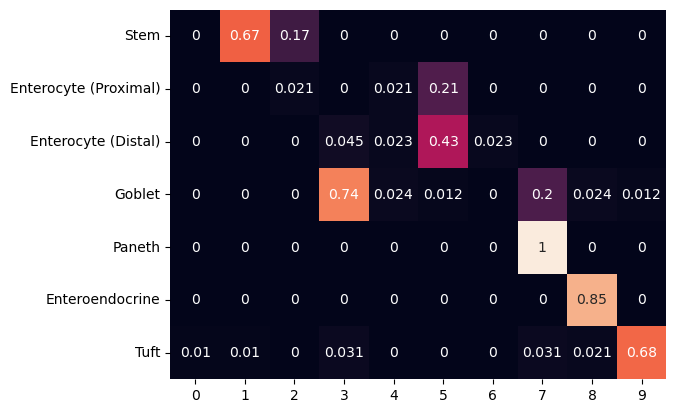

In [17]:
cell_annotation = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r0.5')
cell_annotation_norm = sc.tl.marker_gene_overlap(adata, marker_genes, key='rank_genes_r0.5', normalize='reference')
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

This heatmap is very important.
1. Cluster 0,2,4,6 : These clusters dont have strong connections due to my former gene annotation.
2. Cluster 1: This has strong connection with **Stem**, so we can assume it's the stem cell.
3. Same for cluster 3,5,7,8,9


### Validation of marker genes
I will select **Stem** and **Goblet** as example. 

#### Validation for Stem gene groups

In [18]:
manual_groups = {
    'Stem_related': ['0', '2', '4', '6'],
    'Stem' : ['1'],
    'Goblet': ['3'],
    'Enterocyte': ['5'],
    'Paneth': ['7'],
    'Enteroendocrine': ['8'],
    'Tuft': ['9']
}
# Assign manual groups
adata.obs['manual_groups'] = adata.obs['leiden_r0.5'].map(
    {cluster: group for group, clusters in manual_groups.items() for cluster in clusters}
)
# Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

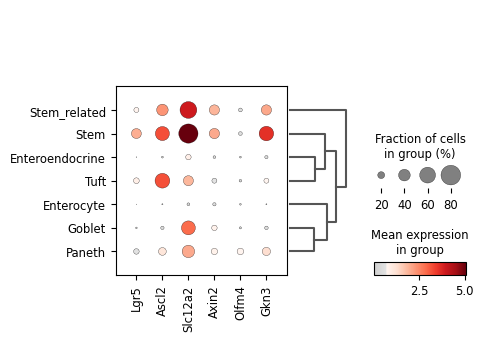

In [19]:
stem_markers = marker_genes['Stem']
sc.pl.dotplot(adata, var_names=stem_markers, groupby='manual_groups', 
              color_map=mymap, dendrogram=True)

Accroding to this dotplot, we can learn two things：
1. **Stem** and **Stem_related** have much more stem gene expression.
2. 'Gkn3', 'Ascl2', 'Slc12a2' are top three gene in the stem genes.

In [79]:
# stem_mask = adata.obs['manual_groups'] == 'Stem'
# adata_stem = adata[stem_mask, :]
# # Get the top 3 genes for each cluster
# top_Stem_genes = sc.pl.dotplot(adata_stem, var_names=stem_markers, groupby='manual_groups', 
#                           color_map=mymap, dendrogram=False, return_fig=True).var_names[:3]

In [20]:
# Calculate the mean expression for stem_markers across the stem group
stem_mask = adata.obs['manual_groups'] == 'Stem'
adata_stem = adata[stem_mask, :]
marker_expr = adata_stem[:, stem_markers].X.mean(axis=0)

# Sort genes by mean expression
top_genes_idx = np.argsort(marker_expr)[::-1][:3]
top_stem_genes = np.array(stem_markers)[top_genes_idx].tolist()

print("Top 3 stem cell marker genes based on mean expression:", top_stem_genes)


Top 3 stem cell marker genes based on mean expression: ['Slc12a2', 'Gkn3', 'Ascl2']


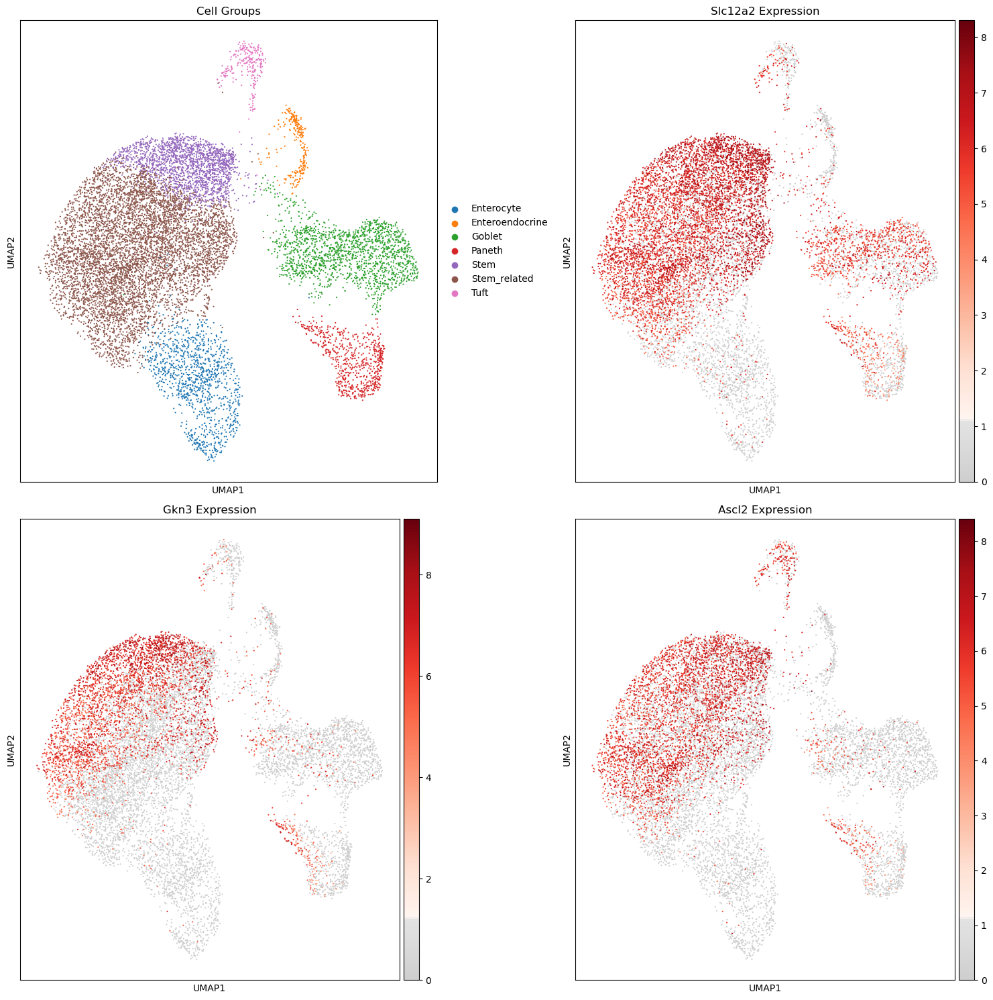

In [21]:
# Plot the UMAP
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
axs = axs.flatten()  # Convert axs to 1D array
sc.pl.umap(adata, color='manual_groups', title='Cell Groups', ax=axs[0], show=False)

for i, gene in enumerate(top_stem_genes):
    if i < 3:  
        sc.pl.umap(adata, color=gene, title=f'{gene} Expression', 
                   color_map=mymap, ax=axs[i+1], show=False)

plt.tight_layout()
plt.show()


From above figures, we can see all top three 'Lgr5', 'Ascl2' and 'Slc12a2'stem genes expressed well especially on the stem and stem_related groups. And next step I will check the average stem cell expression on the UMAP.

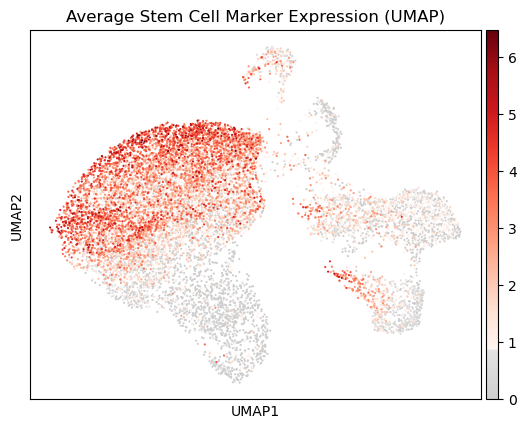

In [22]:
adata.obs['Stem_marker'] = adata[:, stem_markers].X.mean(1)

sc.pl.umap(adata, color='Stem_marker', 
           title='Average Stem Cell Marker Expression (UMAP)'
           ,color_map=mymap)


This above figure also proved our thought about , stem genes expressed well on this stem cluster. In addition, the diffmap is also a good tool to check this.

In [23]:
if 'X_diffmap' not in adata.obsm.keys():
    sc.tl.diffmap(adata)
    

top_genes_idx = np.argsort(marker_expr)[::-1][:5]
top_stem_genes = np.array(stem_markers)[top_genes_idx].tolist()


In [24]:
def plot_diffmap(adata, genes, components='1,2', size=20):
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    # Plot the diffmap for cell types
    sc.pl.diffmap(adata, color='manual_groups', components=components, 
                  title='Cell Types', ax=axes[0], show=False)

    # Plot the diffmap for stem cell markers
    for i, gene in enumerate(genes):
        if gene in adata.var_names:
            sc.pl.diffmap(adata, color=gene, components=components, 
                          title=f'{gene} Expression', color_map=mymap, 
                          ax=axes[i+1], show=False)
        else:
            axes[i+1].text(0.5, 0.5, f"{gene} not found", ha='center', va='center')
            axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()



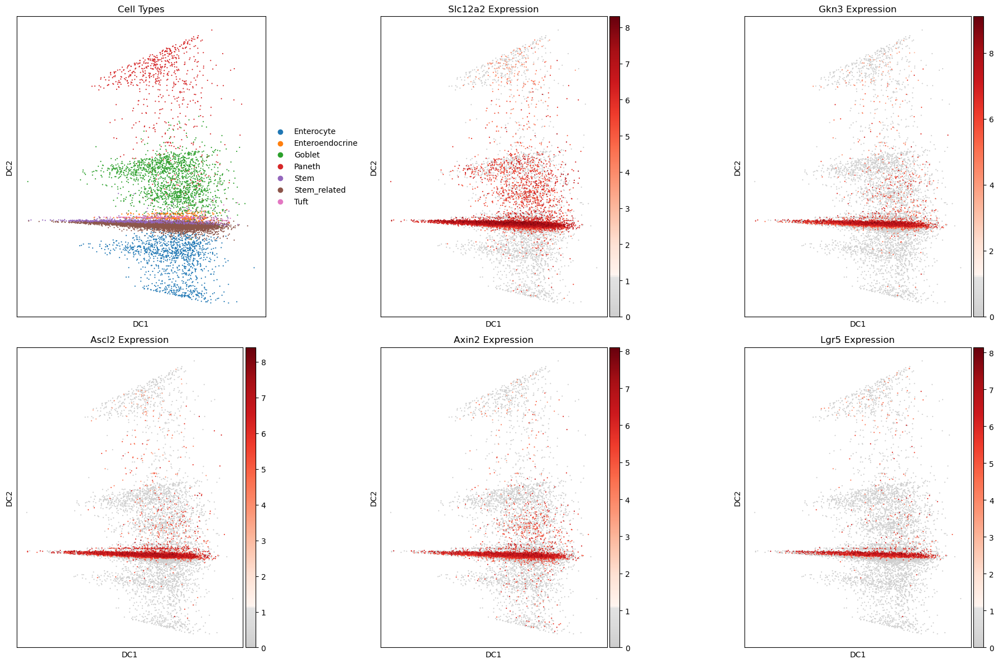

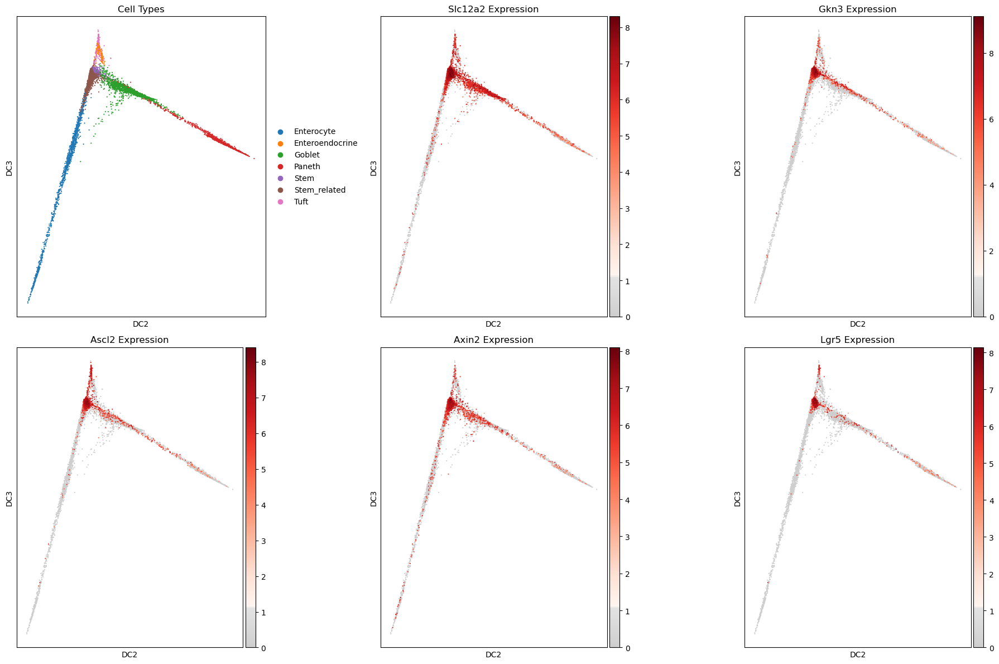

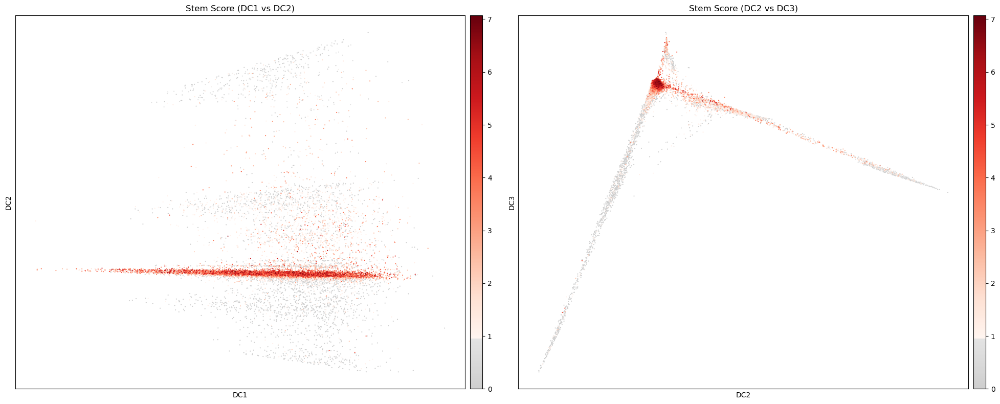

In [25]:
plot_diffmap(adata, top_stem_genes, components='1,2')
plot_diffmap(adata, top_stem_genes, components='2,3')

adata.obs['Stem_score'] = adata[:, top_stem_genes].X.mean(axis=1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

sc.pl.diffmap(adata, color='Stem_score', components='1,2', 
              title='Stem Score (DC1 vs DC2)', color_map=mymap, ax=ax1, show=False)
sc.pl.diffmap(adata, color='Stem_score', components='2,3', 
              title='Stem Score (DC2 vs DC3)', color_map=mymap, ax=ax2, show=False)

plt.tight_layout()
plt.show()

1. The analysis highlights a clear stem cell cluster characterized by the expression of well-established markers such as Lgr5, Slc12a2, Ascl2, and Axin2. These markers are strongly localized within the central region of the diffusion map, corresponding to cells with high Stem Scores.
2. The Goblet cells appear to be more spatially separated from stem cells, likely indicating a more differentiated state. Gkn3 is highly expressed in a distinct cluster, which might represent a transitional or specialized population.
3. Lgr5 remains the most prominent marker, confirming its essential role in defining stem cell identity and proliferation.
4. Overall, the analysis suggests a well-defined stem cell niche that is central to the differentiation trajectory of various intestinal cell types.

In conclusion, these findings align with what we would expect from a stem cell hierarchy, where stem cells reside in the central region of the diffusion space and give rise to more specialized cells like enterocytes, goblet cells, and Paneth cells.

#### Validation for Goblet gene groups

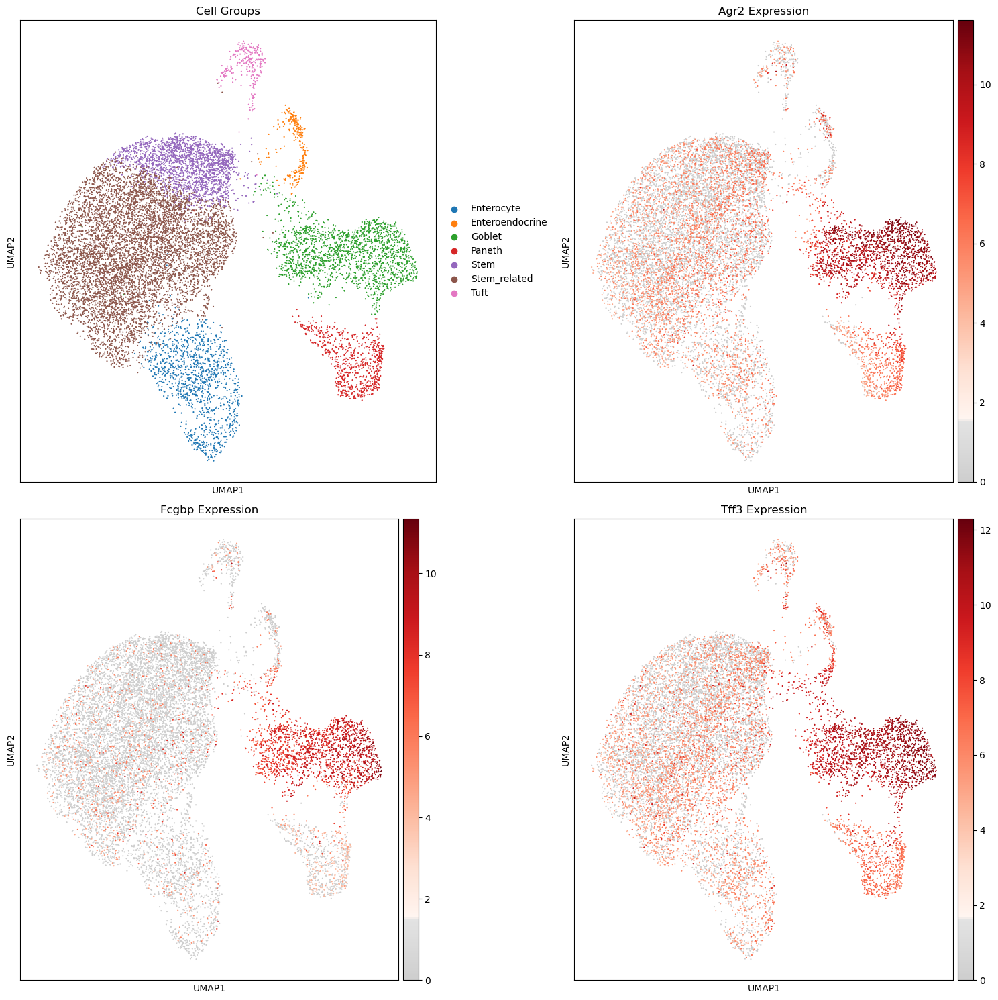

In [67]:
goblet_markers = marker_genes['Goblet']
#sc.pl.dotplot(adata, var_names=stem_markers, groupby='manual_groups', color_map=mymap, dendrogram=True)
# Get the top 3 genes for each cluster
available_goblet_markers = [gene for gene in goblet_markers if gene in adata.var_names]

top_genes = sc.pl.dotplot(adata, var_names=available_goblet_markers, groupby='manual_groups', 
                          color_map=mymap, dendrogram=True, return_fig=True).var_names[:3]
# Plot the UMAP
fig, axs = plt.subplots(2, 2, figsize=(15, 15))
axs = axs.flatten()  # Convert axs to 1D array
sc.pl.umap(adata, color='manual_groups', title='Cell Groups', ax=axs[0], show=False)

for i, gene in enumerate(top_genes):
    if i < 3:  
        sc.pl.umap(adata, color=gene, title=f'{gene} Expression', 
                   color_map=mymap, ax=axs[i+1], show=False)

plt.tight_layout()
plt.show()


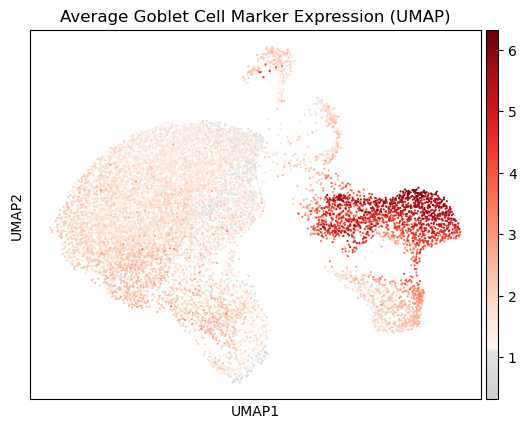

In [84]:
adata.obs['available_goblet_markers'] = adata[:, available_goblet_markers].X.mean(1)

sc.pl.umap(adata, color='available_goblet_markers', 
           title='Average Goblet Cell Marker Expression (UMAP)'
           ,color_map=mymap)


Top 5 expressed genes in Goblet cells:
Tff3, Agr2, Lgals2, Spink4, Lgals4


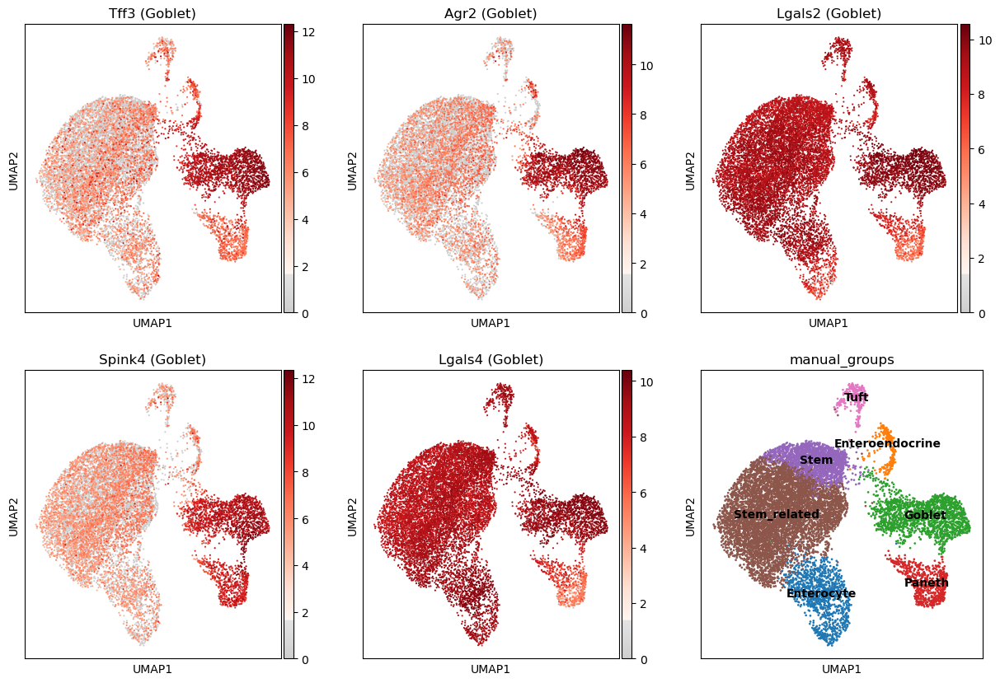

<Figure size 640x480 with 0 Axes>

In [99]:
goblet_mask = adata.obs['manual_groups'] == 'Goblet'
adata_goblet = adata[goblet_mask, :]

mean_expr = np.mean(adata_goblet.X, axis=0)

top_genes_idx = np.argsort(mean_expr)[::-1][:5]
top_goblet_genes = adata.var_names[top_genes_idx].tolist()

print("Top 5 expressed genes in Goblet cells:")
print(', '.join(top_goblet_genes))

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, gene in enumerate(top_goblet_genes):
    sc.pl.umap(adata, color=gene, title=f'{gene} (Goblet)', 
               color_map=mymap, ax=axes[i], show=False)

sc.pl.umap(adata, color='manual_groups', size=15,ax = axes[-1] ,legend_loc='on data')

plt.tight_layout()
plt.show()


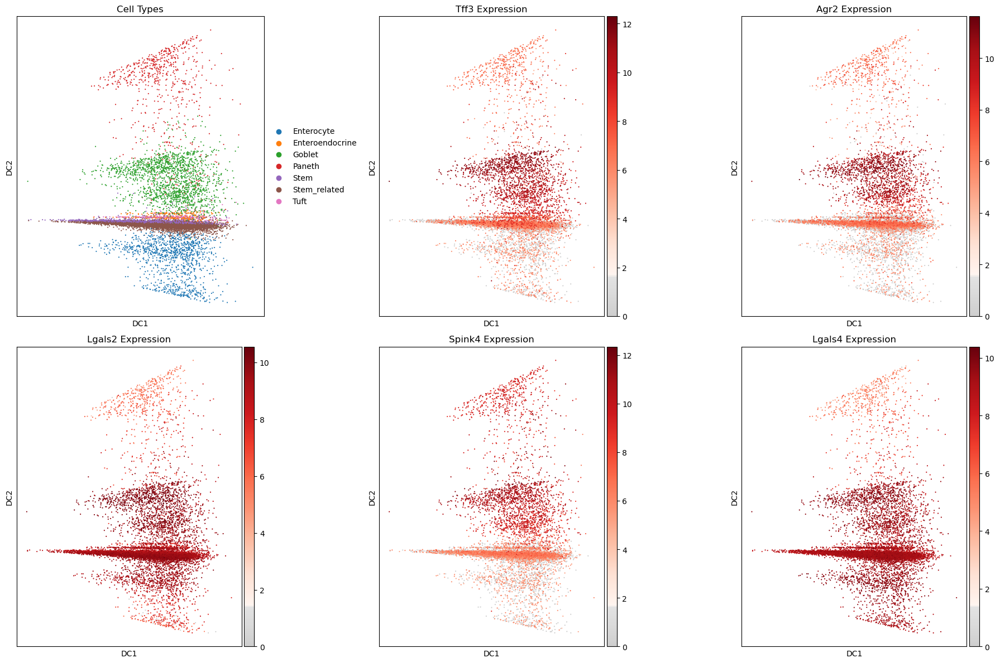

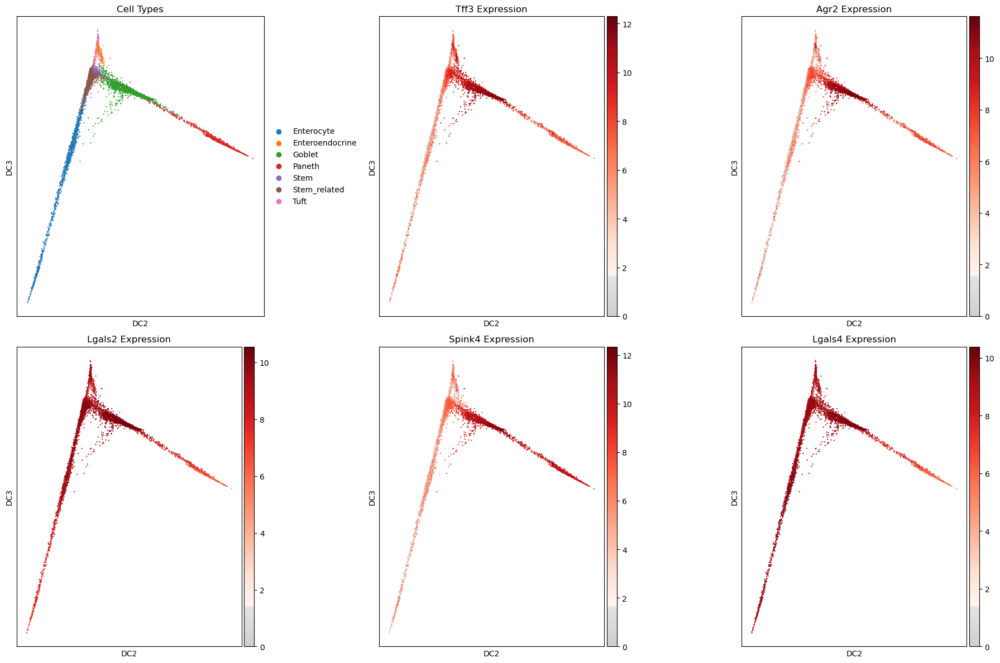

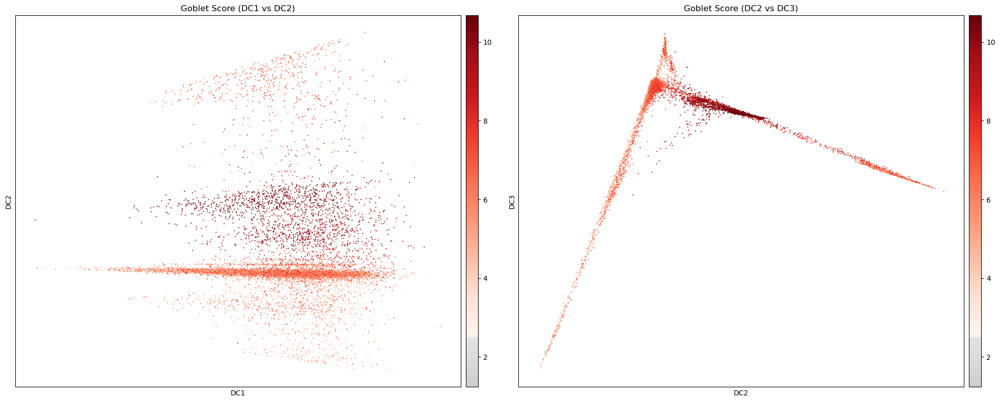

In [100]:
if 'X_diffmap' not in adata.obsm.keys():
    sc.tl.diffmap(adata)

goblet_genes = top_goblet_genes


plot_diffmap(adata, goblet_genes, components='1,2')
plot_diffmap(adata, goblet_genes, components='2,3')

adata.obs['Goblet_score'] = adata[:, goblet_genes].X.mean(axis=1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

sc.pl.diffmap(adata, color='Goblet_score', components='1,2', 
              title='Goblet Score (DC1 vs DC2)', color_map=mymap, ax=ax1, show=False)
sc.pl.diffmap(adata, color='Goblet_score', components='2,3', 
              title='Goblet Score (DC2 vs DC3)', color_map=mymap, ax=ax2, show=False)

plt.tight_layout()
plt.show()

From my perspective, I think maybe we should validate all cluster that we did early to find whether they all qualified. But due to the complexity I only validate **Stem** and **Goblet**. We can see **Stem** cluster performs very well. But for **Goblet**, there are some high expressed genes also performs very well on other cluster. Maybe because these genes due to their biology characters, they will performs well on stem cells. But maybe it is because that I didn't cluster well. So I think this is more like the EDA analysis, we should try some other normalization method, use the Batch correction and do some other kinds cluster untill we get the ideal cluster. 

### Sub-cluster
In the former cluster, because we didn't recognize cluster 0,2,4,6. We directly assign them as a **stem_raleted**. In this section we will use known gene expression to cluster them.

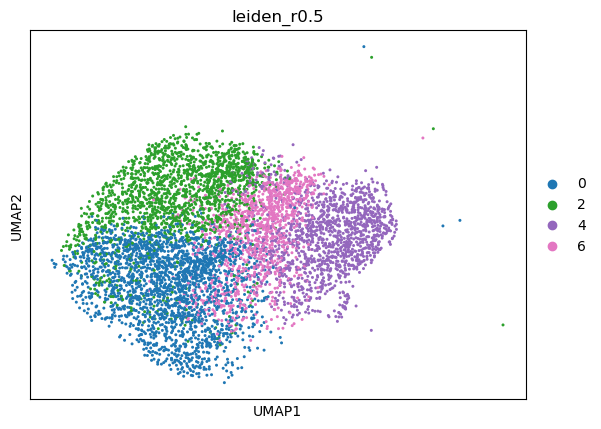

In [114]:
stem_related_adata = adata[adata.obs['manual_groups'] == 'Stem_related'].copy()
sc.pl.umap(stem_related_adata, color=['leiden_r0.5'])


In [115]:
# Define the sub cell types
subtype_marker_genes = {
    'EP (early)': ['Lgr5', 'Olfm4', 'Ascl2'],
    'TA': ['Sox9', 'Mki67'],
    'EP (stress)': ['Dclk1', 'Reg4']
}

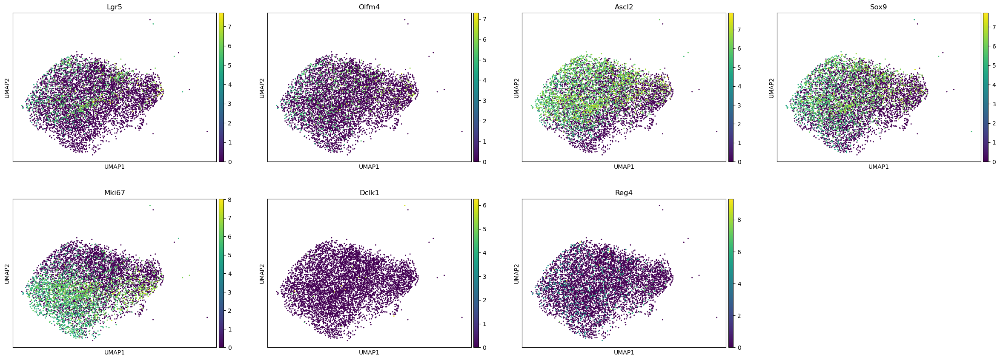

In [120]:
sc.pl.umap(stem_related_adata, color=sum(subtype_marker_genes.values(), []), ncols=4, use_raw=False)


In [122]:
subtype_map = stem_related_adata.obs['subtype'].to_dict()

stem_related_indices = stem_related_adata.obs_names

adata.obs.loc[stem_related_indices, 'subtype'] = stem_related_adata.obs['subtype']

print(adata.obs['subtype'].value_counts())


subtype
EP (early)     3074
Unassigned     1684
TA             1606
EP (stress)      97
Name: count, dtype: int64


<Axes: >

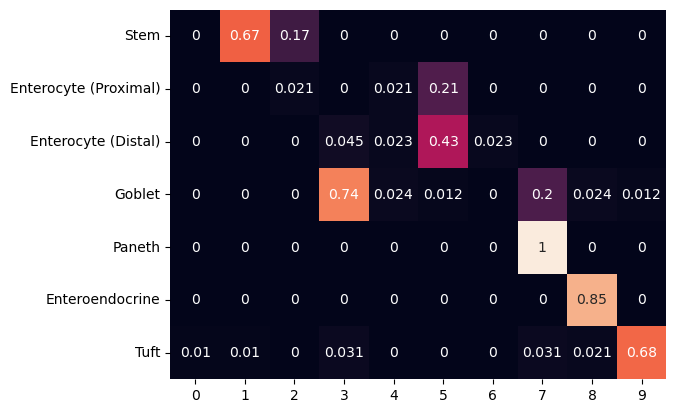

In [27]:
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)

Untill now, I found I can't separate them well. I look back into my heatmap. I found this cluster didn't perform well. Such as cluster 2,4,5 they all like a mixture of different cells. For cluster 7 I searched, Goblet genes will perfom on Paneth. I should repeat the normalization and umap to get a better heatmap, after that I should do the future analysis. 

### Final Cluster Result

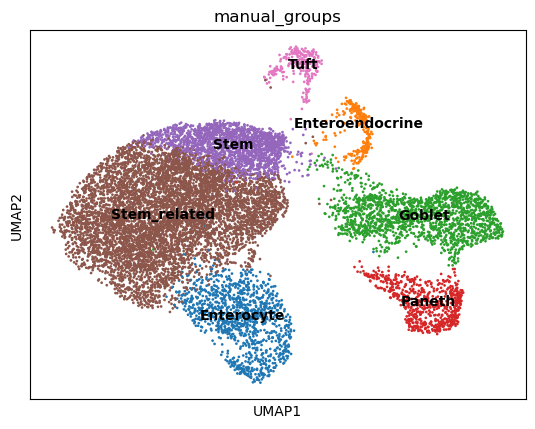

In [97]:
sc.pl.umap(adata, color='manual_groups', size=15, legend_loc='on data')

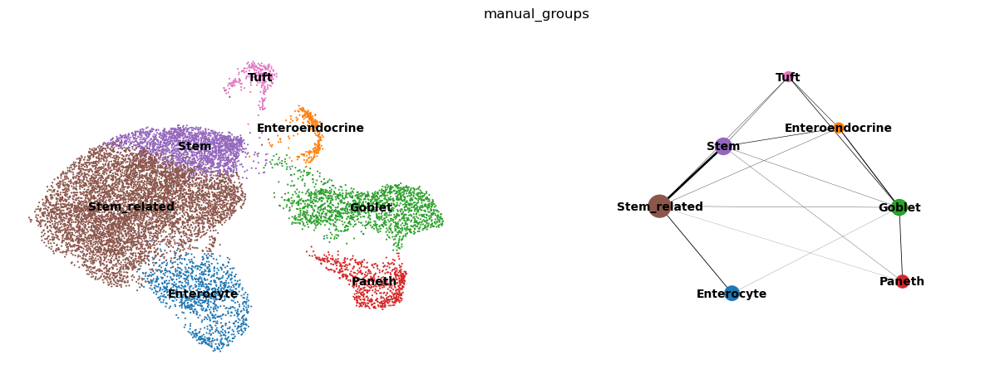

[<Axes: xlabel='UMAP1', ylabel='UMAP2'>, <Axes: >]

In [98]:
sc.tl.paga(adata, groups='manual_groups')
sc.pl.paga_compare(adata)


## Pseudotime Analysis

In [48]:
# adata.write('/home/yiyang/github/MD/data/mouse_after_cluster.h5ad')


In [2]:
adata = sc.read('/home/yiyang/github/MD/data/mouse_after_cluster.h5ad')
adata.shape

(12457, 12818)

In [3]:
adata.obs['manual_groups'].value_counts()

manual_groups
Stem_related       6461
Stem               1971
Goblet             1685
Enterocyte         1154
Paneth              669
Enteroendocrine     261
Tuft                256
Name: count, dtype: int64

In [12]:
adata_traj = adata.copy()


In [13]:
stem_mask = adata_traj.obs['manual_groups'] == 'Stem'
if stem_mask.sum() > 0:
    adata_traj.uns['iroot'] = np.where(stem_mask)[0][0]
else:
    raise ValueError("No Stem cells found in the data")

In [14]:
sc.tl.diffmap(adata_traj)
sc.tl.dpt(adata_traj)


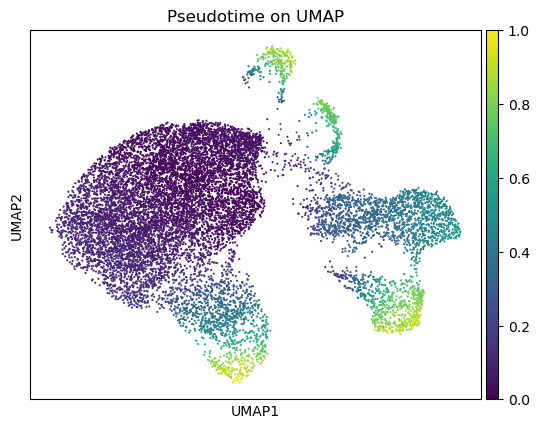

In [32]:
sc.pl.umap(adata_traj, color='dpt_pseudotime', title='Pseudotime on UMAP')
plt.show()


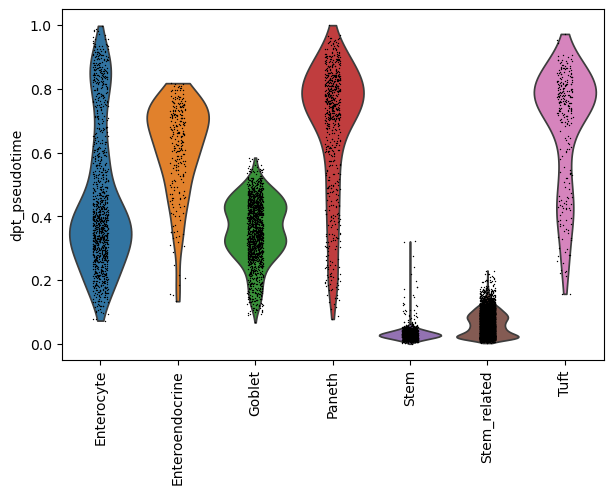

In [33]:
# Violin plot of pseudotime for each cell type
sc.pl.violin(adata_traj, 'dpt_pseudotime', groupby='manual_groups', rotation=90)
plt.show()

The data capture a continuum from stem cells to multiple differentiated cell types.
Multiple differentiation pathways exist that may lead to different cell types
Stem and Stem_related cells may be the starting point of differentiation, while Enterocyte, Enteroendocrine and Tuft cells may be the end point of differentiation.
The differentiation process does not appear to be linear, but rather contains multiple branches and possible intermediate states.
